need to install google-cloud-vision (GCP SDK) from conda -c conda-forge 

conda env create gcp-cloud-vision
conda install -c conda-forge pillow=10.1.0 pandas=2.1.2 google-cloud-vision=3.4.5 scikit-learn=1.3.2 ipykernel jupyterlab notebook python=3.12.0

to set up kernel in jupyterlabs:

python -m ipykernel install --user --name=gcp-cloud-vision


In [ ]:
# Authentication to Google API
import os
import math
import json
from collections import Counter
from google.cloud import vision
import re
from datetime import datetime
import io

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] ='arcane-legacy-457717-u2-c427e51e0a61.json'
WORD = re.compile(r"\w+")

In [2]:
image_path = r".\images\test\jpgs\001s3.jpg"

In [ ]:

def save_results(response, filename='extraction_results.json'):
    if not response.text_annotations:
        print("No text detected in image")
        return None
    
    # Extract all text and structure
    result_data = {
        'full_text': response.text_annotations[0].description,
        'text_annotations': [],
        'detected_languages': []
    }
    
    # Save all text annotations with positions
    for annotation in response.text_annotations:
        annotation_data = {
            'text': annotation.description,
            'bounding_poly': {
                'vertices': [{'x': v.x, 'y': v.y} for v in annotation.bounding_poly.vertices]
            },
            'confidence': getattrannotation, 'confidence', 0)
        }
        result_data['text_annotations'].append(annotation_data)
    
    # Save detected languages if available
    # if hasattr(response, 'text_annotations') and response.text_annotations:
    #     for page in getattr(response, 'full_text_annotation', {}).get('pages', []):
    #         for block in page.get('blocks', []):
    #             for paragraph in block.get('paragraphs', []):
    #                 detected_languages = getattr(paragraph, 'property', {}).get('detected_languages', [])
    #                 for lang in detected_languages:
    #                     if lang.language_code not in result_data['detected_languages']:
    #                         result_data['detected_languages'].append(lang.language_code)
    
    # Save to file
    with open(filename, 'w', encoding='utf-8') as f:
        json.dump(result_data, f, indent=2, ensure_ascii=False)
    
    print(f"Results saved to {filename}")
    print(f"Detected text length: {len(result_data['full_text'])} characters")
    print(f"Number of text elements: {len(result_data['text_annotations'])}")
    
    return result_data


In [4]:
def detect_text(path):
    """Detects text in the file."""

    client = vision.ImageAnnotatorClient()

    with open(path, "rb") as image_file:
        content = image_file.read()

    image = vision.Image(content=content)

    response = client.document_text_detection(image=image)
    texts = response.text_annotations
    ocr_text = []
    

    for text in texts:
        ocr_text.append(f" {text.description}")

    if response.error.message:
        raise Exception(
            "{}\nFor more info on error messages, check: "
            "https://cloud.google.com/apis/design/errors".format(response.error.message)
        )
        
    # clean_text = re.sub(r'\s+', ' ', full_extracted_text).strip()
    # lines = full_extracted_text.split('\n')
    # cleaned_lines = [line.strip() for line in lines if line.strip()]
    # clean_text = "\n".join(cleaned_lines)
    
    save_results(response)

    return ocr_text

text = detect_text(image_path)
print(text)

Results saved to extraction_results.json
Detected text length: 966 characters
Number of text elements: 220
[" Wing 758088\n269275\n0\nC\nMAKLUMAT PEMAKANAN / NUTRITION FACTS\nHidangan Per Pakej/Serving Per Package: 3\nJumlah Hidangan/Serving Size: 1/3 can (100g)\nSETIAR\nHIDANGAN/\nSETIAP\n100g/\nPER SERVING PER 100g\nTenaga/Energy\n222 kcal 222 kcal\n(932kJ)\n(932kJ)\nProtein/Protein\n19.0 g\n19.0\ng\nJumlah Lemak/Total Fat\n15.5 g\n15.5 g\n- Lemak Tepu/Saturated Fat\n9.2 g\n9.2 g\nLemak Trans/Trans Fat\n0.0 g\n0.0 g\nKolesterol/Cholesterol\n25 mg\n25 mg\nKarbohidrat/ Carbohydrate\n1.7 g\n1.7 g\nFiber Diet/Dietary Fibre\nSodium/Sodium\nJumlah Gula/Total Sugars\n0.0 g\n0.0 g\n0.0 g\n0.0 g\n445 mg\n445 mg\nSetiap 100g Mengandungi/Each 100g Contains:\nCalories\nKalori\n222kcal\nGula\nSugars\nLemak\n15.5g\nFats\nTepu\nGaram\nSaturates\n9.2g\nSalt\n1.1g\n11%\n0%\n22%\n46%\n%81-\nNasihat\ndaripada jumlah harian panduan orang dewasa/\nBest before D/M/Y Shown on Packaging\nof an adult's guide

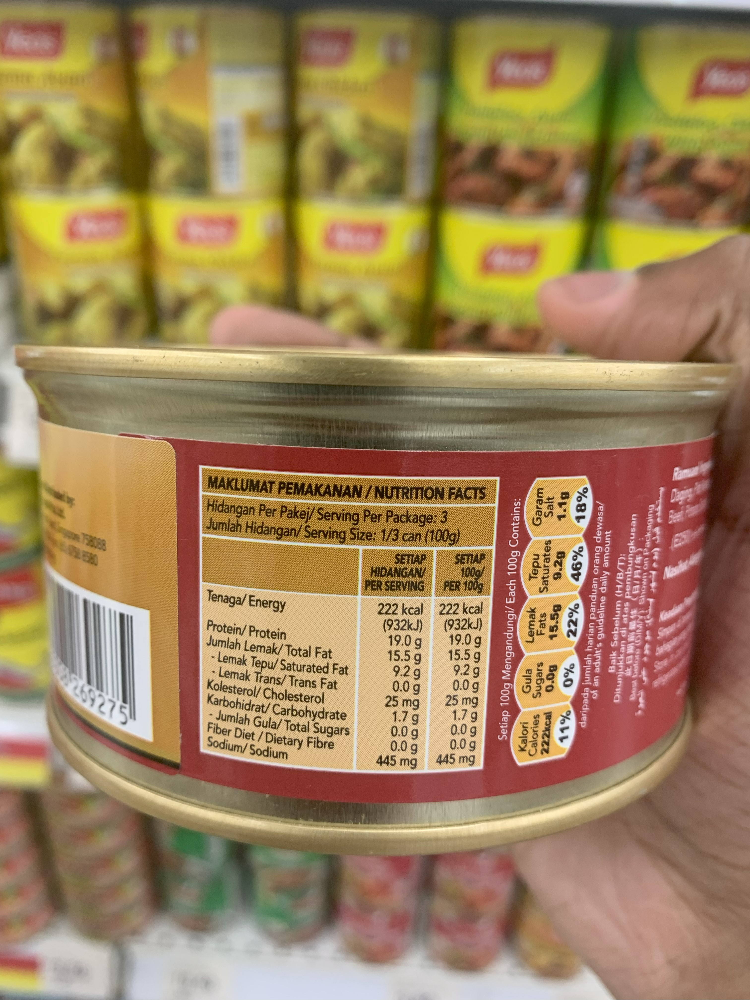

In [5]:
from PIL import Image, ImageDraw
image=Image.open(image_path)
image